In [1]:
import numpy as np
import seaborn as sns
import pandas as pd
import matplotlib.pyplot as plt
%matplotlib inline

In [3]:
df = pd.read_csv("C:/Users/savil/Downloads/bank-additional/bank-additional/bank-additional-full.csv", sep=';')

In [4]:
df.head()

,age,job,marital,education,default,housing,loan,contact,month,day_of_week,...,campaign,pdays,previous,poutcome,emp.var.rate,cons.price.idx,cons.conf.idx,euribor3m,nr.employed,y
0,56,housemaid,married,basic.4y,no,no,no,telephone,may,mon,...,1,999,0,nonexistent,1.1,93.994,-36.4,4.857,5191.0,no
1,57,services,married,high.school,unknown,no,no,telephone,may,mon,...,1,999,0,nonexistent,1.1,93.994,-36.4,4.857,5191.0,no
2,37,services,married,high.school,no,yes,no,telephone,may,mon,...,1,999,0,nonexistent,1.1,93.994,-36.4,4.857,5191.0,no
3,40,admin.,married,basic.6y,no,no,no,telephone,may,mon,...,1,999,0,nonexistent,1.1,93.994,-36.4,4.857,5191.0,no
4,56,services,married,high.school,no,no,yes,telephone,may,mon,...,1,999,0,nonexistent,1.1,93.994,-36.4,4.857,5191.0,no


In [6]:
df.isnull().sum()

age               0
job               0
marital           0
education         0
default           0
housing           0
loan              0
contact           0
month             0
day_of_week       0
duration          0
campaign          0
pdays             0
previous          0
poutcome          0
emp.var.rate      0
cons.price.idx    0
cons.conf.idx     0
euribor3m         0
nr.employed       0
y                 0
dtype: int64

In [7]:
df.dtypes

age                 int64
job                object
marital            object
education          object
default            object
housing            object
loan               object
contact            object
month              object
day_of_week        object
duration            int64
campaign            int64
pdays               int64
previous            int64
poutcome           object
emp.var.rate      float64
cons.price.idx    float64
cons.conf.idx     float64
euribor3m         float64
nr.employed       float64
y                  object
dtype: object

In [9]:
import pandas_profiling as pp

In [10]:
dir(pp)

['Config',
 'ProfileReport',
 '__builtins__',
 '__cached__',
 '__doc__',
 '__file__',
 '__init__',
 '__loader__',
 '__name__',
 '__package__',
 '__path__',
 '__spec__',
 '__version__',
 'clear_config',
 'config',
 'controller',
 'model',
 'pandas_decorator',
 'profile_report',
 'report',
 'serialize_report',
 'utils',
 'version',
 'visualisation']

In [45]:
pp.ProfileReport(df, orange_mode = True)

# Changing data types

In [12]:
pd.get_dummies(df, df.columns[df.dtypes == 'object'])

,age,duration,campaign,pdays,previous,emp.var.rate,cons.price.idx,cons.conf.idx,euribor3m,nr.employed,...,day_of_week_fri,day_of_week_mon,day_of_week_thu,day_of_week_tue,day_of_week_wed,poutcome_failure,poutcome_nonexistent,poutcome_success,y_no,y_yes
0,56,261,1,999,0,1.1,93.994,-36.4,4.857,5191.0,...,0,1,0,0,0,0,1,0,1,0
1,57,149,1,999,0,1.1,93.994,-36.4,4.857,5191.0,...,0,1,0,0,0,0,1,0,1,0
2,37,226,1,999,0,1.1,93.994,-36.4,4.857,5191.0,...,0,1,0,0,0,0,1,0,1,0
3,40,151,1,999,0,1.1,93.994,-36.4,4.857,5191.0,...,0,1,0,0,0,0,1,0,1,0
4,56,307,1,999,0,1.1,93.994,-36.4,4.857,5191.0,...,0,1,0,0,0,0,1,0,1,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
41183,73,334,1,999,0,-1.1,94.767,-50.8,1.028,4963.6,...,1,0,0,0,0,0,1,0,0,1
41184,46,383,1,999,0,-1.1,94.767,-50.8,1.028,4963.6,...,1,0,0,0,0,0,1,0,1,0
41185,56,189,2,999,0,-1.1,94.767,-50.8,1.028,4963.6,...,1,0,0,0,0,0,1,0,1,0
41186,44,442,1,999,0,-1.1,94.767,-50.8,1.028,4963.6,...,1,0,0,0,0,0,1,0,0,1


In [13]:
for i in df.columns[df.dtypes == 'object']:
    print(i, "::", df[i].unique())

job :: ['housemaid' 'services' 'admin.' 'blue-collar' 'technician' 'retired'
 'management' 'unemployed' 'self-employed' 'unknown' 'entrepreneur'
 'student']
marital :: ['married' 'single' 'divorced' 'unknown']
education :: ['basic.4y' 'high.school' 'basic.6y' 'basic.9y' 'professional.course'
 'unknown' 'university.degree' 'illiterate']
default :: ['no' 'unknown' 'yes']
housing :: ['no' 'yes' 'unknown']
loan :: ['no' 'yes' 'unknown']
contact :: ['telephone' 'cellular']
month :: ['may' 'jun' 'jul' 'aug' 'oct' 'nov' 'dec' 'mar' 'apr' 'sep']
day_of_week :: ['mon' 'tue' 'wed' 'thu' 'fri']
poutcome :: ['nonexistent' 'failure' 'success']
y :: ['no' 'yes']


In [14]:
df2 = df

In [15]:
for i in df.columns[df.dtypes == 'object']:
    print(i, "::")
    df2[i] = df[i].astype('category')
    df2[i] = df2[i].cat.codes

job ::
marital ::
education ::
default ::
housing ::
loan ::
contact ::
month ::
day_of_week ::
poutcome ::
y ::


In [16]:
df2.dtypes

age                 int64
job                  int8
marital              int8
education            int8
default              int8
housing              int8
loan                 int8
contact              int8
month                int8
day_of_week          int8
duration            int64
campaign            int64
pdays               int64
previous            int64
poutcome             int8
emp.var.rate      float64
cons.price.idx    float64
cons.conf.idx     float64
euribor3m         float64
nr.employed       float64
y                    int8
dtype: object

In [17]:
df2.head()

,age,job,marital,education,default,housing,loan,contact,month,day_of_week,...,campaign,pdays,previous,poutcome,emp.var.rate,cons.price.idx,cons.conf.idx,euribor3m,nr.employed,y
0,56,3,1,0,0,0,0,1,6,1,...,1,999,0,1,1.1,93.994,-36.4,4.857,5191.0,0
1,57,7,1,3,1,0,0,1,6,1,...,1,999,0,1,1.1,93.994,-36.4,4.857,5191.0,0
2,37,7,1,3,0,2,0,1,6,1,...,1,999,0,1,1.1,93.994,-36.4,4.857,5191.0,0
3,40,0,1,1,0,0,0,1,6,1,...,1,999,0,1,1.1,93.994,-36.4,4.857,5191.0,0
4,56,7,1,3,0,0,2,1,6,1,...,1,999,0,1,1.1,93.994,-36.4,4.857,5191.0,0


In [18]:
df2.day_of_week.head()

0    1
1    1
2    1
3    1
4    1
Name: day_of_week, dtype: int8

In [19]:
df.shape

(41188, 21)

In [21]:
df2.rename(columns={'y': 'class'}, inplace = True)

In [22]:
df2.head()

,age,job,marital,education,default,housing,loan,contact,month,day_of_week,...,campaign,pdays,previous,poutcome,emp.var.rate,cons.price.idx,cons.conf.idx,euribor3m,nr.employed,class
0,56,3,1,0,0,0,0,1,6,1,...,1,999,0,1,1.1,93.994,-36.4,4.857,5191.0,0
1,57,7,1,3,1,0,0,1,6,1,...,1,999,0,1,1.1,93.994,-36.4,4.857,5191.0,0
2,37,7,1,3,0,2,0,1,6,1,...,1,999,0,1,1.1,93.994,-36.4,4.857,5191.0,0
3,40,0,1,1,0,0,0,1,6,1,...,1,999,0,1,1.1,93.994,-36.4,4.857,5191.0,0
4,56,7,1,3,0,0,2,1,6,1,...,1,999,0,1,1.1,93.994,-36.4,4.857,5191.0,0


In [24]:
df2.columns

Index(['age', 'job', 'marital', 'education', 'default', 'housing', 'loan',
       'contact', 'month', 'day_of_week', 'duration', 'campaign', 'pdays',
       'previous', 'poutcome', 'emp.var.rate', 'cons.price.idx',
       'cons.conf.idx', 'euribor3m', 'nr.employed', 'class'],
      dtype='object')

In [25]:
df['class'].value_counts()

0    36548
1     4640
Name: class, dtype: int64

<AxesSubplot:>

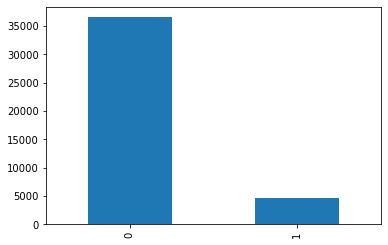

In [26]:
df['class'].value_counts().plot(kind = 'bar') # 0 = no 1 = yes

In [27]:
import pycaret.classification as pc

In [28]:
dir(pc)

['Any',
 'Dict',
 'Display',
 'List',
 'MLUsecase',
 'Optional',
 'Tuple',
 'Union',
 '__builtins__',
 '__cached__',
 '__doc__',
 '__file__',
 '__loader__',
 '__name__',
 '__package__',
 '__spec__',
 'add_metric',
 'automl',
 'blend_models',
 'calibrate_model',
 'compare_models',
 'create_model',
 'deploy_model',
 'enable_colab',
 'ensemble_model',
 'evaluate_model',
 'finalize_model',
 'get_config',
 'get_logs',
 'get_metrics',
 'interpret_model',
 'io',
 'is_in_colab',
 'load_config',
 'load_model',
 'models',
 'np',
 'optimize_threshold',
 'pd',
 'plot_model',
 'predict_model',
 'pull',
 'pycaret',
 'remove_metric',
 'save_config',
 'save_model',
 'set_config',
 'setup',
 'stack_models',
 'traceback',
 'tune_model',
 'warnings']

In [29]:
from pycaret.utils import enable_colab
enable_colab()

Colab mode enabled.


# Train 70 Test 30

In [30]:
pc.setup(data = df2, target = 'class', train_size = 0.7)

,Description,Value
0,session_id,6968
1,Target,class
2,Target Type,Binary
3,Label Encoded,None
4,Original Data,"(41188, 21)"
5,Missing Values,False
6,Numeric Features,19
7,Categorical Features,1
8,Ordinal Features,False
9,High Cardinality Features,False


(False,
 [],
 False,
 {'parameter': 'Hyperparameters',
  'auc': 'AUC',
  'confusion_matrix': 'Confusion Matrix',
  'threshold': 'Threshold',
  'pr': 'Precision Recall',
  'error': 'Prediction Error',
  'class_report': 'Class Report',
  'rfe': 'Feature Selection',
  'learning': 'Learning Curve',
  'manifold': 'Manifold Learning',
  'calibration': 'Calibration Curve',
  'vc': 'Validation Curve',
  'dimension': 'Dimensions',
  'feature': 'Feature Importance',
  'feature_all': 'Feature Importance (All)',
  'boundary': 'Decision Boundary',
  'lift': 'Lift Chart',
  'gain': 'Gain Chart',
  'tree': 'Decision Tree'},
 {'lr': <pycaret.containers.models.classification.LogisticRegressionClassifierContainer at 0x289c19f1670>,
  'knn': <pycaret.containers.models.classification.KNeighborsClassifierContainer at 0x289c19f1820>,
  'nb': <pycaret.containers.models.classification.GaussianNBClassifierContainer at 0x289c19f1880>,
  'dt': <pycaret.containers.models.classification.DecisionTreeClassifierConta

In [31]:
pc.compare_models()

,Model,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC,TT (Sec)
lightgbm,Light Gradient Boosting Machine,0.9170,0.9494,0.5517,0.6519,0.5973,0.5514,0.5540,0.2270
gbc,Gradient Boosting Classifier,0.9168,0.9470,0.5287,0.6591,0.5866,0.5410,0.5451,1.2200
catboost,CatBoost Classifier,0.9152,0.9485,0.5312,0.6462,0.5828,0.5361,0.5395,16.7840
rf,Random Forest Classifier,0.9129,0.9415,0.4989,0.6420,0.5612,0.5137,0.5189,0.6760
xgboost,Extreme Gradient Boosting,0.9123,0.9453,0.5303,0.6277,0.5745,0.5261,0.5286,1.3760
lr,Logistic Regression,0.9100,0.9270,0.3978,0.6619,0.4967,0.4507,0.4684,1.7320
ada,Ada Boost Classifier,0.9094,0.9390,0.3996,0.6557,0.4965,0.4499,0.4667,0.3730
lda,Linear Discriminant Analysis,0.9094,0.9295,0.4856,0.6212,0.5449,0.4954,0.5002,0.0690
ridge,Ridge Classifier,0.9071,0.0000,0.3134,0.6845,0.4296,0.3866,0.4220,0.0290
et,Extra Trees Classifier,0.9067,0.9302,0.4055,0.6275,0.4923,0.4435,0.4566,0.7820


LGBMClassifier(boosting_type='gbdt', class_weight=None, colsample_bytree=1.0,
               importance_type='split', learning_rate=0.1, max_depth=-1,
               min_child_samples=20, min_child_weight=0.001, min_split_gain=0.0,
               n_estimators=100, n_jobs=-1, num_leaves=31, objective=None,
               random_state=6968, reg_alpha=0.0, reg_lambda=0.0, silent=True,
               subsample=1.0, subsample_for_bin=200000, subsample_freq=0)

### Light Gradient Boosting Machine seems to be the better option for predicting this dataset

In [32]:
lgbm = pc.create_model('lightgbm')

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
0,0.9244,0.9544,0.5913,0.6895,0.6367,0.5948,0.5969
1,0.9185,0.9502,0.5776,0.6526,0.6129,0.5675,0.5688
2,0.9171,0.9528,0.5248,0.6627,0.5858,0.5404,0.5450
3,0.9143,0.9535,0.5124,0.6471,0.5719,0.5250,0.5294
4,0.9233,0.9528,0.5807,0.6850,0.6286,0.5862,0.5886
5,0.9174,0.9463,0.5621,0.6511,0.6033,0.5575,0.5594
6,0.9213,0.9468,0.5932,0.6655,0.6273,0.5834,0.5846
7,0.9116,0.9453,0.5373,0.6201,0.5757,0.5266,0.5283
8,0.9126,0.9476,0.5387,0.6282,0.5800,0.5315,0.5335
9,0.9091,0.9448,0.4985,0.6169,0.5514,0.5014,0.5050


In [33]:
Tuned_lgbm = pc.tune_model(lgbm)

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
0,0.9255,0.9559,0.5975,0.6942,0.6423,0.6009,0.6030
1,0.9220,0.9495,0.6118,0.6633,0.6365,0.5929,0.5935
2,0.9237,0.9546,0.5652,0.6947,0.6233,0.5813,0.5852
3,0.9133,0.9508,0.5031,0.6429,0.5645,0.5171,0.5219
4,0.9202,0.9535,0.5776,0.6643,0.6179,0.5736,0.5754
5,0.9122,0.9428,0.5155,0.6312,0.5675,0.5192,0.5225
6,0.9164,0.9427,0.5745,0.6401,0.6056,0.5590,0.5600
7,0.9136,0.9464,0.5342,0.6347,0.5801,0.5324,0.5348
8,0.9116,0.9460,0.5108,0.6298,0.5641,0.5155,0.5190
9,0.9077,0.9442,0.5046,0.6059,0.5507,0.4997,0.5023


In [34]:
lgbm = pc.tune_model(lgbm, optimize = 'Accuracy')

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
0,0.9255,0.9559,0.5975,0.6942,0.6423,0.6009,0.6030
1,0.9220,0.9495,0.6118,0.6633,0.6365,0.5929,0.5935
2,0.9237,0.9546,0.5652,0.6947,0.6233,0.5813,0.5852
3,0.9133,0.9508,0.5031,0.6429,0.5645,0.5171,0.5219
4,0.9202,0.9535,0.5776,0.6643,0.6179,0.5736,0.5754
5,0.9122,0.9428,0.5155,0.6312,0.5675,0.5192,0.5225
6,0.9164,0.9427,0.5745,0.6401,0.6056,0.5590,0.5600
7,0.9136,0.9464,0.5342,0.6347,0.5801,0.5324,0.5348
8,0.9116,0.9460,0.5108,0.6298,0.5641,0.5155,0.5190
9,0.9077,0.9442,0.5046,0.6059,0.5507,0.4997,0.5023


### Lol tuning the model somehow decresed the accuracy as well as everything else
### So far the accuracy is 91.7%

In [35]:
pc.evaluate_model(lgbm)

interactive(children=(ToggleButtons(description='Plot Type:', icons=('',), options=(('Hyperparameters', 'param…

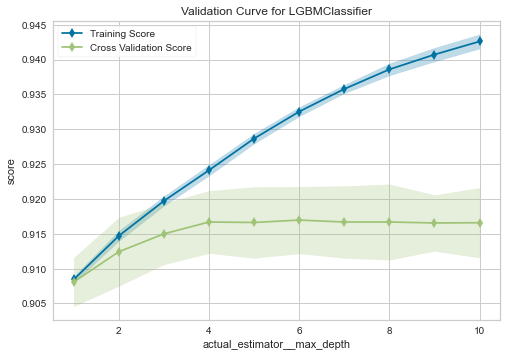

In [37]:
pc.plot_model(lgbm, plot = 'vc')

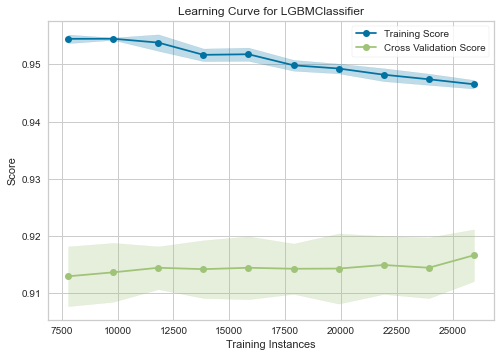

In [39]:
pc.plot_model(lgbm, plot = 'learning')

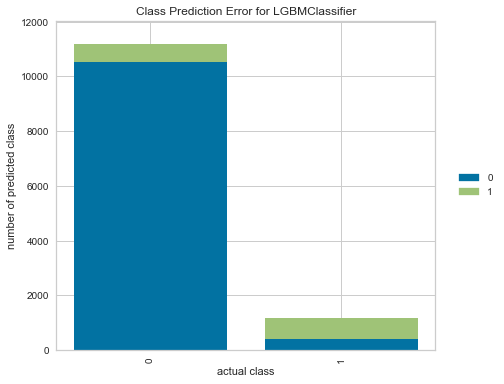

In [40]:
pc.plot_model(lgbm, plot = 'error')

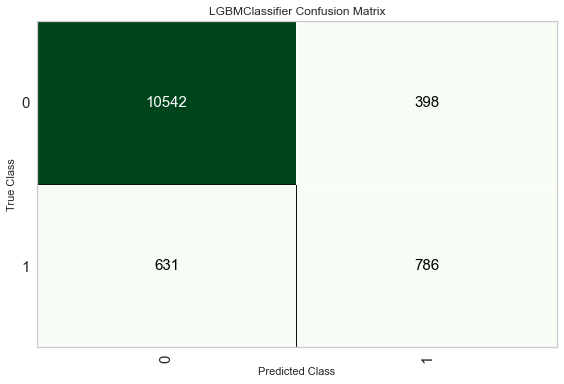

In [41]:
pc.plot_model(lgbm, plot = 'confusion_matrix')

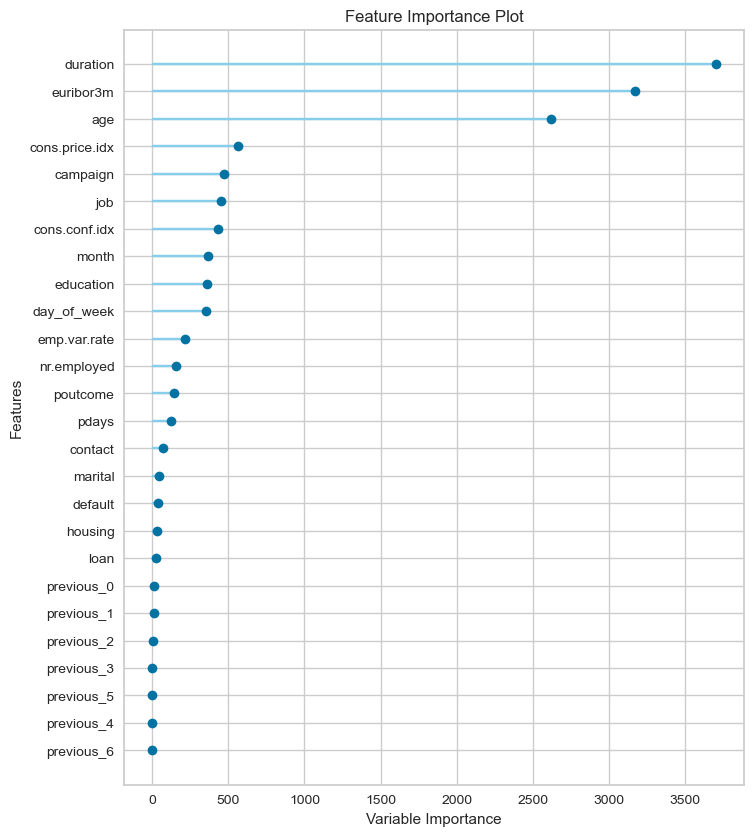

In [42]:
pc.plot_model(lgbm, plot = 'feature_all')

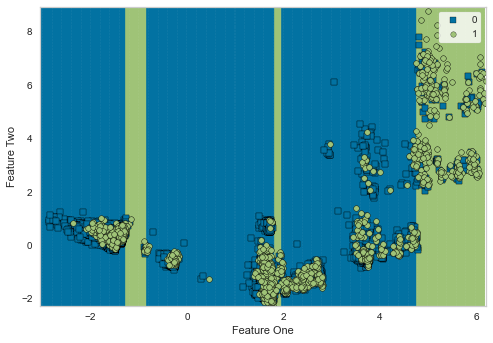

In [43]:
pc.plot_model(lgbm, plot = 'boundary')

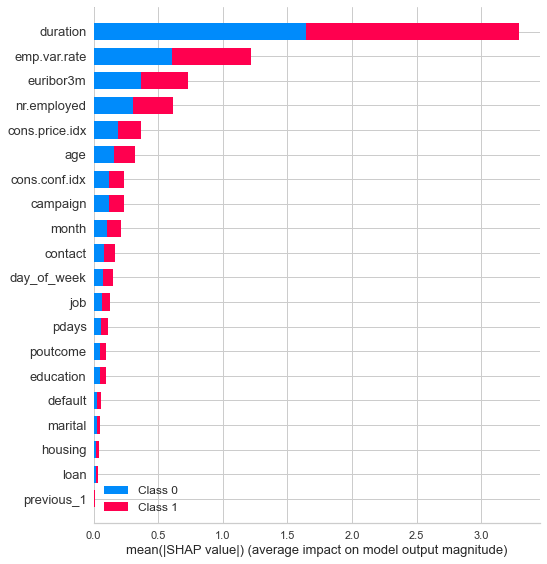

In [63]:
pc.interpret_model(lgbm)

In [64]:
Final_mod = pc.finalize_model(lgbm)

In [65]:
Pred = pc.predict_model(Final_mod)

,Model,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
0,Light Gradient Boosting Machine,0.9422,0.9742,0.6803,0.7869,0.7298,0.6976,0.6999


# Conclusion
+ Light Gradient Boosting ML model would predict a no with the loan with an accuracy of 94.2%
+ This is considering that the dataset itself has many attributes that we already know are important
+ For example the euribor3m attribute is correlated with many other attributes
+ Perhaps maybe too less was trained. What happens if we use the model but with 80/20 train/test?

# Train 80 Test 20

In [82]:
pc.setup(data = df2, target = 'class', train_size = 0.8)

,Description,Value
0,session_id,1004
1,Target,class
2,Target Type,Binary
3,Label Encoded,None
4,Original Data,"(41188, 21)"
5,Missing Values,False
6,Numeric Features,19
7,Categorical Features,1
8,Ordinal Features,False
9,High Cardinality Features,False


(False,
 [],
 False,
 {'parameter': 'Hyperparameters',
  'auc': 'AUC',
  'confusion_matrix': 'Confusion Matrix',
  'threshold': 'Threshold',
  'pr': 'Precision Recall',
  'error': 'Prediction Error',
  'class_report': 'Class Report',
  'rfe': 'Feature Selection',
  'learning': 'Learning Curve',
  'manifold': 'Manifold Learning',
  'calibration': 'Calibration Curve',
  'vc': 'Validation Curve',
  'dimension': 'Dimensions',
  'feature': 'Feature Importance',
  'feature_all': 'Feature Importance (All)',
  'boundary': 'Decision Boundary',
  'lift': 'Lift Chart',
  'gain': 'Gain Chart',
  'tree': 'Decision Tree'},
 {'lr': <pycaret.containers.models.classification.LogisticRegressionClassifierContainer at 0x289d0c2bbb0>,
  'knn': <pycaret.containers.models.classification.KNeighborsClassifierContainer at 0x289d0c2b310>,
  'nb': <pycaret.containers.models.classification.GaussianNBClassifierContainer at 0x289d0c2b490>,
  'dt': <pycaret.containers.models.classification.DecisionTreeClassifierConta

In [83]:
pc.compare_models()

,Model,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC,TT (Sec)
gbc,Gradient Boosting Classifier,0.9163,0.9460,0.5222,0.6593,0.5825,0.5367,0.5414,1.4260
lightgbm,Light Gradient Boosting Machine,0.9163,0.9487,0.5453,0.6505,0.5930,0.5468,0.5495,0.2470
catboost,CatBoost Classifier,0.9158,0.9488,0.5309,0.6526,0.5853,0.5390,0.5427,18.2650
rf,Random Forest Classifier,0.9142,0.9414,0.4970,0.6535,0.5642,0.5176,0.5238,1.0480
xgboost,Extreme Gradient Boosting,0.9140,0.9461,0.5304,0.6399,0.5799,0.5325,0.5354,1.5100
lr,Logistic Regression,0.9095,0.9257,0.4011,0.6575,0.4978,0.4513,0.4682,1.9500
ada,Ada Boost Classifier,0.9095,0.9371,0.3954,0.6605,0.4941,0.4479,0.4660,0.4170
lda,Linear Discriminant Analysis,0.9081,0.9278,0.4843,0.6142,0.5413,0.4910,0.4955,0.0810
et,Extra Trees Classifier,0.9069,0.9308,0.3965,0.6351,0.4881,0.4399,0.4547,0.9590
ridge,Ridge Classifier,0.9062,0.0000,0.3092,0.6786,0.4245,0.3812,0.4164,0.0270


GradientBoostingClassifier(ccp_alpha=0.0, criterion='friedman_mse', init=None,
                           learning_rate=0.1, loss='deviance', max_depth=3,
                           max_features=None, max_leaf_nodes=None,
                           min_impurity_decrease=0.0, min_impurity_split=None,
                           min_samples_leaf=1, min_samples_split=2,
                           min_weight_fraction_leaf=0.0, n_estimators=100,
                           n_iter_no_change=None, presort='deprecated',
                           random_state=1004, subsample=1.0, tol=0.0001,
                           validation_fraction=0.1, verbose=0,
                           warm_start=False)

### Same model but a higher accuruacy of 91.6%
### Gradient boost has same accuracy Except that's it's only winning score, a tie even

In [84]:
lgbm2 = pc.create_model('lightgbm')

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
0,0.9147,0.9476,0.5041,0.6549,0.5697,0.5232,0.5288
1,0.9175,0.9500,0.5583,0.6540,0.6023,0.5566,0.5588
2,0.9244,0.9517,0.6098,0.6818,0.6438,0.6017,0.6028
3,0.9153,0.9442,0.5366,0.6471,0.5867,0.5400,0.5429
4,0.9196,0.9533,0.5474,0.6733,0.6039,0.5597,0.5634
5,0.9117,0.9475,0.5230,0.6266,0.5702,0.5214,0.5240
6,0.9165,0.9497,0.5610,0.6469,0.6009,0.5545,0.5563
7,0.9111,0.9472,0.5014,0.6293,0.5581,0.5093,0.5134
8,0.9196,0.9494,0.5772,0.6615,0.6165,0.5718,0.5735
9,0.9126,0.9462,0.5339,0.6294,0.5777,0.5293,0.5316


In [85]:
Tuned_lgbm2 = pc.tune_model(lgbm2)

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
0,0.9162,0.9466,0.5041,0.6667,0.5741,0.5286,0.5350
1,0.9214,0.9490,0.5881,0.6698,0.6263,0.5825,0.5841
2,0.9184,0.9496,0.5908,0.6488,0.6184,0.5728,0.5736
3,0.9111,0.9447,0.5095,0.6267,0.5620,0.5131,0.5165
4,0.9175,0.9515,0.5610,0.6530,0.6035,0.5577,0.5597
5,0.9129,0.9508,0.5420,0.6289,0.5822,0.5339,0.5358
6,0.9175,0.9503,0.5420,0.6601,0.5952,0.5498,0.5531
7,0.9156,0.9479,0.5339,0.6502,0.5863,0.5398,0.5431
8,0.9175,0.9502,0.5799,0.6465,0.6114,0.5654,0.5664
9,0.9168,0.9472,0.5583,0.6498,0.6006,0.5545,0.5565


In [86]:
GBC = pc.create_model('gbc')

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
0,0.9178,0.9464,0.4959,0.6828,0.5746,0.5303,0.5386
1,0.9202,0.9490,0.5637,0.6710,0.6127,0.5685,0.5712
2,0.9226,0.9509,0.5637,0.6887,0.6200,0.5774,0.5810
3,0.9129,0.9427,0.4797,0.6507,0.5523,0.5052,0.5125
4,0.9168,0.9477,0.5339,0.6589,0.5898,0.5441,0.5478
5,0.9083,0.9415,0.4959,0.6120,0.5479,0.4975,0.5009
6,0.9165,0.9468,0.5176,0.6632,0.5814,0.5359,0.5409
7,0.9147,0.9446,0.5041,0.6549,0.5697,0.5232,0.5288
8,0.9181,0.9475,0.5474,0.6623,0.5994,0.5542,0.5573
9,0.9147,0.9426,0.5203,0.6486,0.5774,0.5307,0.5346


In [87]:
Tuned_GBC = pc.tune_model(GBC)

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
0,0.9126,0.9475,0.5014,0.6401,0.5623,0.5146,0.5193
1,0.9168,0.9485,0.5691,0.6462,0.6052,0.5589,0.5603
2,0.9220,0.9510,0.6179,0.6628,0.6396,0.5959,0.5963
3,0.9190,0.9444,0.5501,0.6678,0.6033,0.5586,0.5619
4,0.9147,0.9508,0.5393,0.6419,0.5862,0.5390,0.5416
5,0.9144,0.9469,0.5501,0.6364,0.5901,0.5426,0.5444
6,0.9096,0.9460,0.5339,0.6099,0.5694,0.5191,0.5205
7,0.9105,0.9458,0.5149,0.6209,0.5630,0.5136,0.5164
8,0.9211,0.9485,0.5772,0.6719,0.6210,0.5772,0.5793
9,0.9129,0.9461,0.5339,0.6314,0.5786,0.5304,0.5327


### Tuning the Light gradient boost model increase accuracy by 0.0002% but Tuning decreases GBC acc

In [88]:
pc.evaluate_model(Tuned_lgbm2)

interactive(children=(ToggleButtons(description='Plot Type:', icons=('',), options=(('Hyperparameters', 'param…

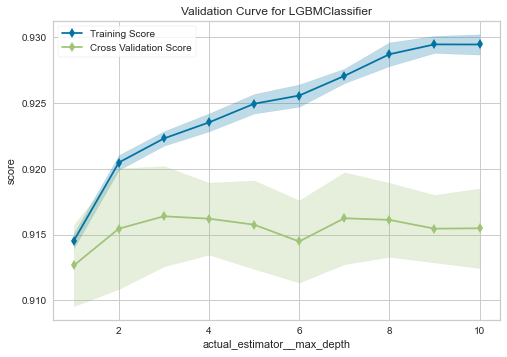

In [89]:
pc.plot_model(Tuned_lgbm2, plot = 'vc')

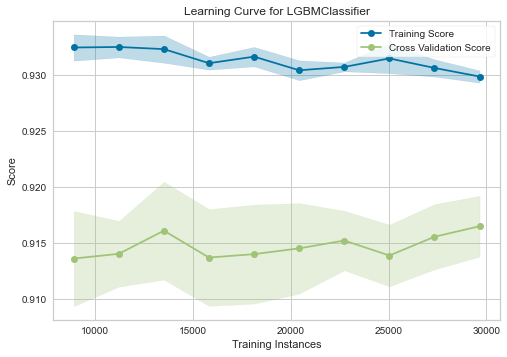

In [90]:
pc.plot_model(Tuned_lgbm2, plot = 'learning')

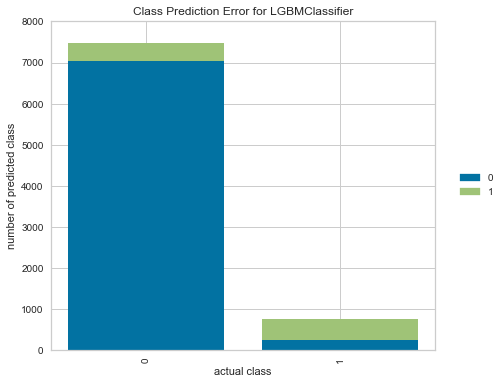

In [91]:
pc.plot_model(Tuned_lgbm2, plot = 'error')

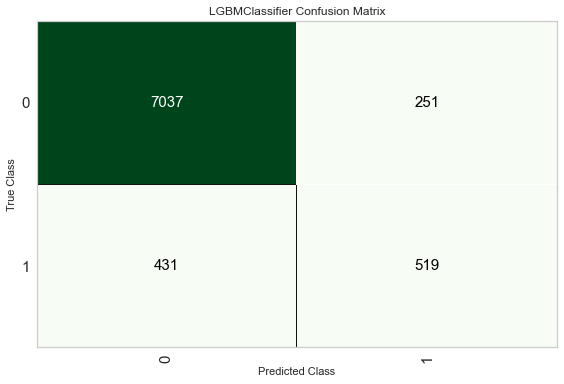

In [92]:
pc.plot_model(Tuned_lgbm2, plot = 'confusion_matrix')

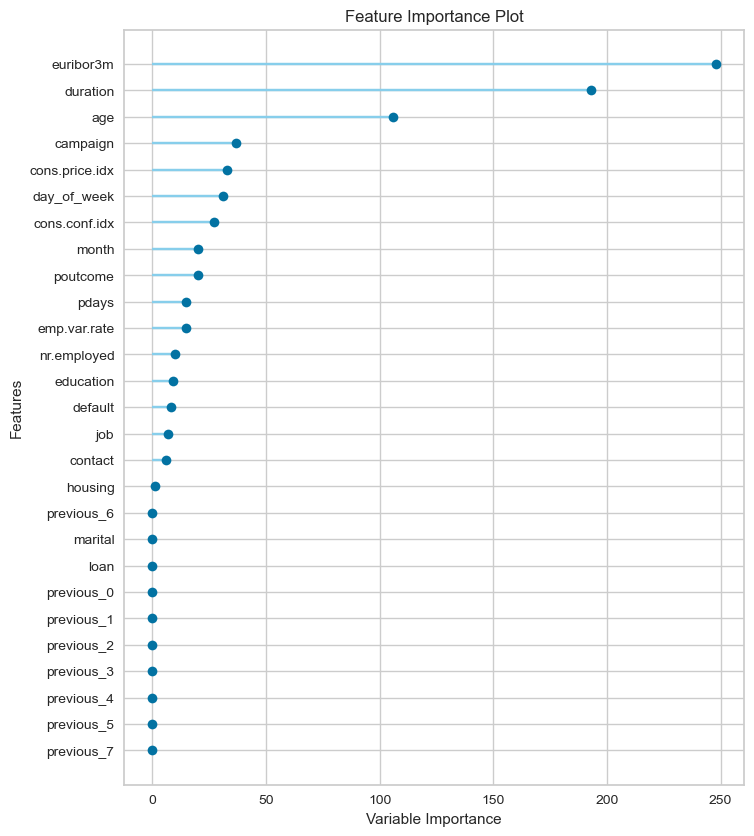

In [93]:
pc.plot_model(Tuned_lgbm2, plot = 'feature_all')

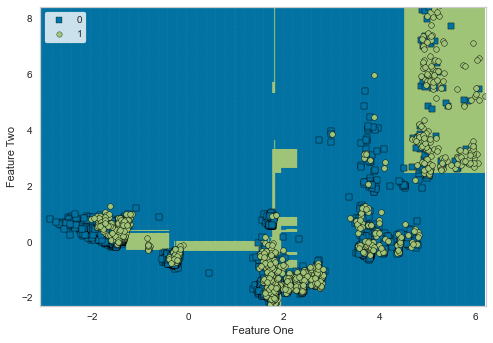

In [94]:
pc.plot_model(Tuned_lgbm2, plot = 'boundary')

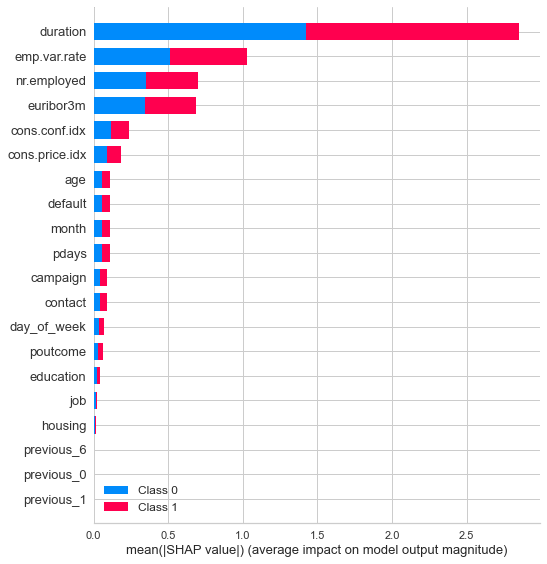

In [95]:
pc.interpret_model(Tuned_lgbm2)

In [99]:
pc.evaluate_model(GBC)

interactive(children=(ToggleButtons(description='Plot Type:', icons=('',), options=(('Hyperparameters', 'param…

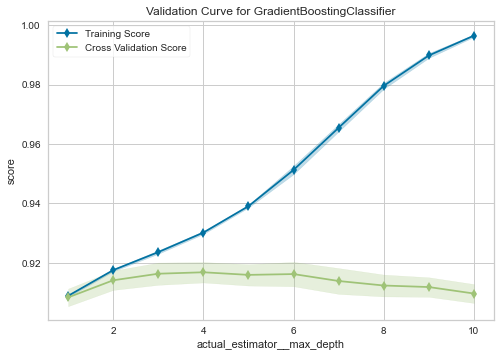

In [100]:
pc.plot_model(GBC, plot = 'vc')

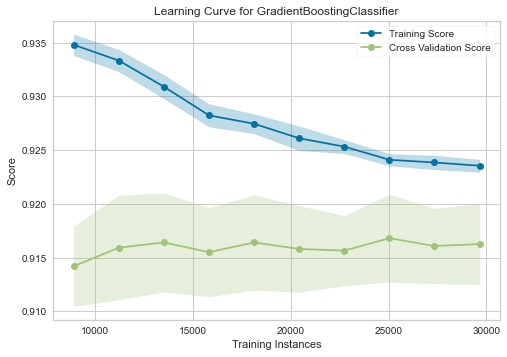

In [101]:
pc.plot_model(GBC, plot = 'learning')

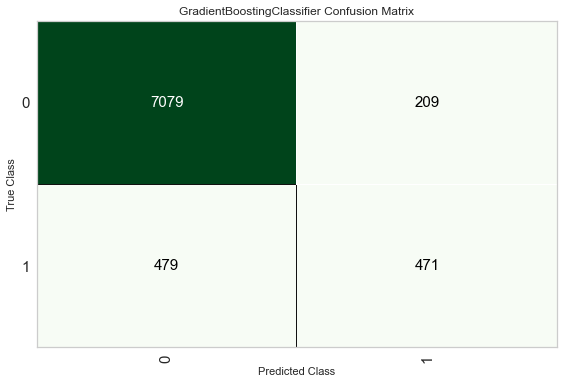

In [102]:
pc.plot_model(GBC, plot = 'confusion_matrix')

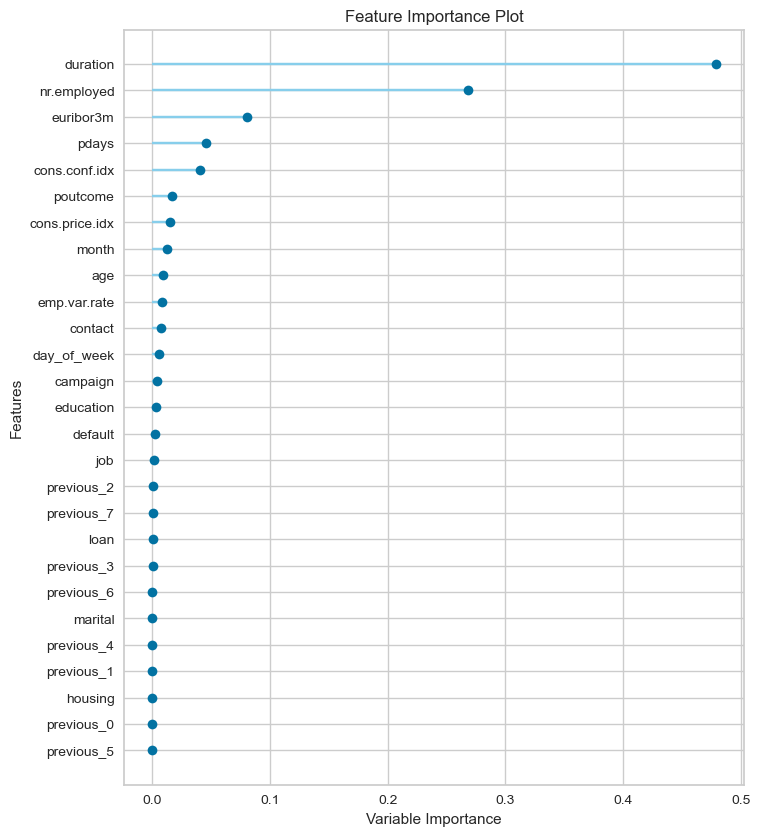

In [103]:
pc.plot_model(GBC, plot = 'feature_all')

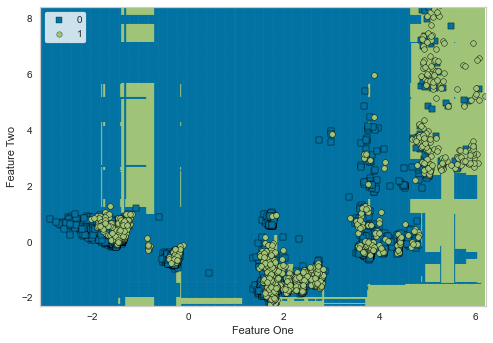

In [104]:
pc.plot_model(GBC, plot = 'boundary')

In [106]:
Final_ModGBC = pc.finalize_model(GBC)

In [107]:
Pred3 = pc.predict_model(Final_ModGBC)

,Model,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
0,Gradient Boosting Classifier,0.9215,0.9530,0.5242,0.7186,0.6062,0.5638,0.5724


In [96]:
Final_mod2 = pc.finalize_model(Tuned_lgbm2)

In [98]:
Pred2 = pc.predict_model(Final_mod2)

,Model,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
0,Light Gradient Boosting Machine,0.9318,0.9645,0.6105,0.7513,0.6736,0.6360,0.6403


# Conclusion
+ Interestingly the model under the 80/20 train/test rule was initially slightly more accuracte at the beginning
+ However when finalazing the model the accuracy score came to 93.1% lower than the lgbm model following 70/30 train/test
+ Not only that but the 70/30 model has a higher score with AUC, Recall, Prec., F1, Kappa, MCC
+ Gradient Boost Classifier had a lower score of 92.1%